<a href="https://colab.research.google.com/github/praveenkumarbalakrishnan/tasks/blob/main/SIG788_Engineering__AI_solutions_Task_4_2D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Title:** Task 4.2D: SIG788 Engineering AI solutions

**Name:** Praveenkumar Balakrishnan

**Student Number:** 223029369

**Email Address:** s223029369@deakin.edu.au

# Install

In [ ]:
!pip install azure-cognitiveservices-vision-customvision

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 KB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 KB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 KB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.5/174.5 KB 15.9 MB/s eta 0:00:00


# Import

In [ ]:
import json
import os
import time
import uuid

import cv2

import pandas as pd

from google.colab.patches import cv2_imshow

from azure.cognitiveservices.vision.customvision.training import CustomVisionTrainingClient
from azure.cognitiveservices.vision.customvision.prediction import CustomVisionPredictionClient
from azure.cognitiveservices.vision.customvision.training.models import ImageFileCreateBatch, ImageFileCreateEntry, Region
from msrest.authentication import ApiKeyCredentials

Added subscription keys and endpoint

In [ ]:
ENDPOINT = "https://custimvisiongroup.cognitiveservices.azure.com/"
training_key = "d58fa4b5660e476db8c9ee0005202756"
prediction_resource_id = "/subscriptions/84bd4663-5df3-49e8-943e-ba5879616bac/resourceGroups/custom_vision_resourse_group/providers/Microsoft.CognitiveServices/accounts/custimvisiongroup-Prediction"

Instantiated training and prediction clients with the keys and endpoints

In [ ]:
credentials = ApiKeyCredentials(in_headers={"Training-key": training_key})
trainer = CustomVisionTrainingClient(ENDPOINT, credentials)

Created a new custom vision project, used universal unique identifier to avoid project name collisions

In [ ]:
publish_iteration_name = "TrackingModel"
obj_detection_domain = next(
    domain for domain in trainer.get_domains() \
    if domain.type == "ObjectDetection" and domain.name == "General")
project = trainer.create_project(
    str(uuid.uuid4()), domain_id=obj_detection_domain.id)

In [ ]:
publish_iteration_name = "TrackingModel"
project = trainer.get_project('594cad94-48af-4711-aadf-86dbc2d48366')

Created tags for car and truck

In [ ]:
car_tag = trainer.create_tag(project.id, "car")
truck_tag = trainer.create_tag(project.id, "truck")

Define Image folder

In [ ]:
images_folder = "/content/drive/MyDrive/Images/"

Created a function to generate the tag image regions using the csv file extracted from VGG Image Annotator tool. To tag the images in object detection project we need to normalize the coordinates so normalized the cordinates using the height and width of the image and added the image and region details in the corresponding category

In [ ]:
def generate_tag_image_regions(images_folder, df):
  """
  This function is to tag image regions and return normalized bounding box cordinates

  Parameters
  ----------
  images_folder: str
    Image foldder path
  df: Pandas DataFrame
    Dataframe with filename and it's image region

  Returns
  -------
  car_image_region_dict: dict
    Car image region dictionary
  truck_image_region_dict: dict
    Truck image regions dictionary
  """
  car_image_region_dict = {}
  truck_image_region_dict = {}
  for i, row in df.iterrows():
    h_img, w_img, _ = cv2.imread(
        os.path.join(images_folder, row['filename'])).shape
    bb_values = json.loads(row['region_shape_attributes'])
    tag_dict = json.loads(row['region_attributes'])
    x = bb_values['x'] / w_img
    y = bb_values['y'] / h_img 
    w = bb_values['width'] / w_img
    h = bb_values['height'] / h_img
    if tag_dict['name'].strip() == 'car':
      car_image_region_dict[row['filename'].strip()] = [x, y, w, h]
    elif tag_dict['name'].strip() == 'truck':
      truck_image_region_dict[row['filename'].strip()] = [x, y, w, h]
  return car_image_region_dict, truck_image_region_dict

Generated image regions

In [ ]:
regions_df = pd.read_csv(os.path.join(images_folder, 'regions.csv'))
car_image_regions, truck_image_regions = generate_tag_image_regions(images_folder, regions_df)

Uploaded each images with it's normalized image co-ordinates

In [ ]:
base_image_location = images_folder

# Go through the data table above and create the images
print ("Adding images...")
tagged_images_with_regions = []

for file_name in car_image_regions.keys():
    x,y,w,h = car_image_regions[file_name]
    regions = [Region(tag_id=car_tag.id, left=x,top=y,width=w,height=h)]

    with open(
        os.path.join(
            base_image_location, file_name
            ), mode="rb") as image_contents:
        tagged_images_with_regions.append(
            ImageFileCreateEntry(
                name=file_name,
                contents=image_contents.read(),
                regions=regions))
        
for file_name in truck_image_regions.keys():
    x,y,w,h = truck_image_regions[file_name]
    regions = [Region(tag_id=truck_tag.id, left=x,top=y,width=w,height=h)]

    with open(
        os.path.join(
            base_image_location, file_name
            ), mode="rb") as image_contents:
        tagged_images_with_regions.append(
            ImageFileCreateEntry(
                name=file_name,
                contents=image_contents.read(),
                regions=regions))

upload_result = trainer.create_images_from_files(
    project.id, ImageFileCreateBatch(images=tagged_images_with_regions))

Adding images...


Trained the model on multiple iterations by adding new images to get the reasonable prediction

In [ ]:
print ("Training...")
iteration = trainer.train_project(project.id)
while (iteration.status != "Completed"):
    iteration = trainer.get_iteration(project.id, iteration.id)
    print ("Training status: " + iteration.status)
    time.sleep(1)

Training...
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training
Training status: Training


# Published the Trained model

In [ ]:
# The iteration is now trained. Publish it to the project endpoint
trainer.publish_iteration(
    project.id, iteration.id, publish_iteration_name, prediction_resource_id)
print ("Done!")

Done!


In [ ]:
prediction_key = "3b635d23b51d4bb1a43da56d24753d64"
ENDPOINT = "https://custimvisiongroup-prediction.cognitiveservices.azure.com/"
credentials = ApiKeyCredentials(in_headers={"Prediction-key": prediction_key})
predictor = CustomVisionPredictionClient(endpoint=ENDPOINT, credentials=credentials)

In [ ]:
trackerType = "MEDIANFLOW"   
multiTracker = cv2.legacy.MultiTracker_create()
tracker = cv2.legacy.TrackerMedianFlow_create()

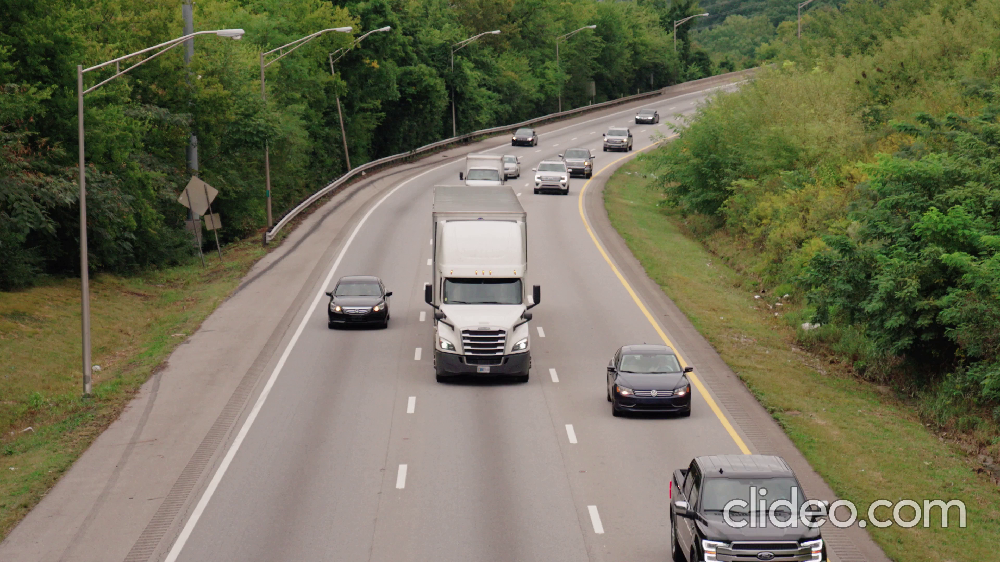

In [28]:
cap = cv2.VideoCapture('/content/drive/MyDrive/Images/prediction_vid.mp4')
count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if ret:
        cv2.imwrite(os.path.join(images_folder,'frame{:d}.jpg'.format(count)), frame)
        with open(os.path.join(images_folder, 'frame{:d}.jpg'.format(count)), mode="rb") as test_data:
          results = predictor.detect_image(
              project.id, publish_iteration_name, test_data)
        count += 30 # i.e. at 30 fps, this advances one second
        cap.set(cv2.CAP_PROP_POS_FRAMES, count)

        success, boxes = multiTracker.update(frame)
        for i, newbox in enumerate(boxes):
          p1 = (int(newbox[0]), int(newbox[1]))
          p2 = (int(newbox[0] + newbox[2]), int(newbox[1] + newbox[3]))
          cv2.rectangle(frame, p1, p2, (0, 255, 0), 2, 1)
        cv2_imshow(frame)

        for prediction in results.predictions:
          if prediction.probability > 0.1:
            bbox = (
                prediction.bounding_box.left, prediction.bounding_box.top,
                prediction.bounding_box.width, prediction.bounding_box.height)
            multiTracker.add(tracker, frame, bbox)

        break
    else:
        cap.release()
        break

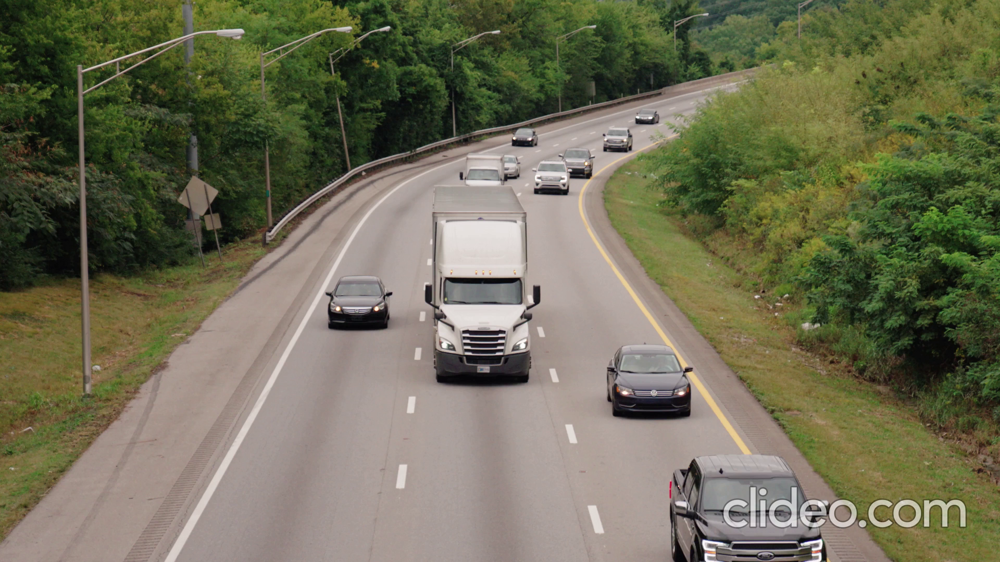

In [ ]:
cv2_imshow(frame)

In [31]:
prediction_key = "3b635d23b51d4bb1a43da56d24753d64"
ENDPOINT = "https://custimvisiongroup-prediction.cognitiveservices.azure.com/"
credentials = ApiKeyCredentials(in_headers={"Prediction-key": prediction_key})
predictor = CustomVisionPredictionClient(endpoint=ENDPOINT, credentials=credentials)

with open(os.path.join(images_folder, "frame0.jpg"), mode="rb") as test_data:
    results = predictor.detect_image(
        project.id, publish_iteration_name, test_data)

# Display the results.    
for prediction in results.predictions:
  if prediction.probability > 0.1:
    print("\t" + prediction.tag_name + ": {0:.2f}% bbox.left = {1:.2f}, bbox.top = {2:.2f}, bbox.width = {3:.2f}, bbox.height = {4:.2f}".format(prediction.probability * 100, prediction.bounding_box.left, prediction.bounding_box.top, prediction.bounding_box.width, prediction.bounding_box.height))

	car: 92.07% bbox.left = 0.42, bbox.top = 0.36, bbox.width = 0.12, bbox.height = 0.33
	car: 87.68% bbox.left = 0.61, bbox.top = 0.61, bbox.width = 0.08, bbox.height = 0.15
	car: 76.19% bbox.left = 0.32, bbox.top = 0.48, bbox.width = 0.06, bbox.height = 0.11
	car: 50.72% bbox.left = 0.67, bbox.top = 0.78, bbox.width = 0.14, bbox.height = 0.22
	car: 39.63% bbox.left = 0.54, bbox.top = 0.26, bbox.width = 0.05, bbox.height = 0.08
	car: 17.85% bbox.left = 0.50, bbox.top = 0.19, bbox.width = 0.04, bbox.height = 0.07
	car: 16.47% bbox.left = 0.63, bbox.top = 0.18, bbox.width = 0.04, bbox.height = 0.06
	car: 16.37% bbox.left = 0.60, bbox.top = 0.19, bbox.width = 0.04, bbox.height = 0.07
	car: 13.97% bbox.left = 0.59, bbox.top = 0.23, bbox.width = 0.05, bbox.height = 0.07
